# Preprocessing

## Removing folders with < 4 images

In [ ]:
import os
import shutil
from tqdm.notebook import tqdm
import numpy as np
import cv2

def remove_small_folders(directory, min_files):
    for foldername in os.listdir(directory):
        folder_path = os.path.join(directory, foldername)
        if os.path.isdir(folder_path):
            files_in_folder = os.listdir(folder_path)
            if len(files_in_folder) < min_files:
                print(f"Removing folder: {folder_path}")
                shutil.rmtree(folder_path) # for removing extra folders


# Our Labelled Faces in the Wild (LFW) dataset in the Google Drive
directory_path = "/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled"
min_files_count = 4

#remove_small_folders(directory_path, min_files_count)

In [ ]:
remove_small_folders('/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped', min_files_count)

Removing folder: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Adam_Sandler
Removing folder: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Abel_Pacheco
Removing folder: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Amer_al-Saadi
Removing folder: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Amanda_Bynes
Removing folder: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Alvaro_Silva_Calderon
Removing folder: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Alec_Baldwin
Removing folder: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Antonio_Banderas
Removing folder: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Angelo_Reyes
Removing folder: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Anders_Fogh_Rasmussen
Removing folder: /content/drive/MyDrive/archive/lf

In [ ]:
!python -V

Python 3.10.12


In [ ]:
# pip install DeepFace

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 33.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 44.9 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=df5fdba2a16df720f48b79fddf48645a3b1a3cbb0c65b3db3943f9b51f3b7827
  Stored in directory: /root/.cache/pip/wheels/19/39/2f/2d3cadc408a8804103f1c34ddd4b9f6a93497b11fa96fe738e
Successfully built fire


In [ ]:
# pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 904.3/904.3 kB 15.4 MB/s eta 0:00:00


## Example of cropping an image with Yolov8 backbone

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
24-12-28 21:47:37 - Downloading Yolo weights from https://drive.google.com/uc?id=1qcr9DbgsX3ryrz2uU8w4Xm3cOrRywXqb to /root/.deepface/weights/yolov8n-face.pt...


Downloading...
From: https://drive.google.com/uc?id=1qcr9DbgsX3ryrz2uU8w4Xm3cOrRywXqb
To: /root/.deepface/weights/yolov8n-face.pt
100%|██████████| 6.39M/6.39M [00:00<00:00, 155MB/s]


24-12-28 21:47:40 - Yolo model is just downloaded to yolov8n-face.pt


(140, 101, 3)

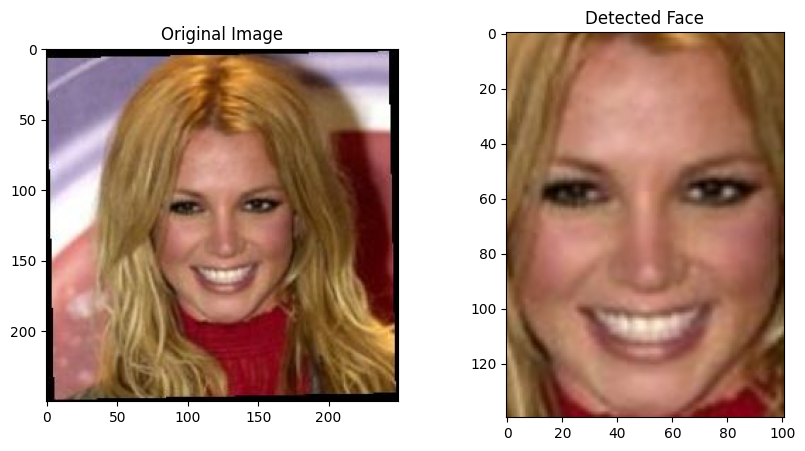

In [ ]:
from deepface import DeepFace
import cv2
from  matplotlib import pyplot as plt



path = '/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled/Britney_Spears/Britney_Spears_0001.jpg'
face_objs = DeepFace.extract_faces(img_path = path,
        #target_size = (224, 224),
        detector_backend = 'yolov8'
    )
face_image = face_objs[0]['face']  # Extract the face image

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(plt.imread(path))
axs[0].set_title('Original Image')

axs[1].imshow(face_image)
axs[1].set_title('Detected Face')
face_image.shape

## Removing images where number of faces is less than 1 or more than 1

In [ ]:
def remove_invalid_images(directory, min_faces=1, max_faces=1):
    for foldername in tqdm(os.listdir(directory)):
        folder_path = os.path.join(directory, foldername)
        if os.path.isdir(folder_path):
            for filename in os.listdir(folder_path):
                if filename.endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif')):
                    image_path = os.path.join(folder_path, filename)
                    try:
                        # Trying to extract faces using Yolov8
                        face_objs = DeepFace.extract_faces(img_path=image_path, detector_backend='yolov8')
                        # Checking number of found faces
                        if len(face_objs) < min_faces or len(face_objs) > max_faces:
                            print(f"Removing image: {image_path}")
                            os.remove(image_path)
                    except Exception as e:
                        print(f"Error processing image {image_path}: {e}")
                        os.remove(image_path)

directory_path = '/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled'

# Min and max number of faces allowed on a photo
min_faces_count = 1
max_faces_count = 1

remove_invalid_images(directory_path, min_faces_count, max_faces_count)

  0%|          | 0/610 [00:00<?, ?it/s]

Removing image: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled/Alan_Greenspan/Alan_Greenspan_0002.jpg
Removing image: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled/Adrien_Brody/Adrien_Brody_0011.jpg
Removing image: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled/Adrien_Brody/Adrien_Brody_0002.jpg
Removing image: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled/Adrien_Brody/Adrien_Brody_0003.jpg
Removing image: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled/Adrien_Brody/Adrien_Brody_0006.jpg
Removing image: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled/Adrien_Brody/Adrien_Brody_0007.jpg
Removing image: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled/Adam_Sandler/Adam_Sandler_0004.jpg
Removing image: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled/Abdullah_Gul/Abdullah_Gul_0009.jpg
Removing image: /content/drive/MyDrive/archive/lfw-deepfunneled/lfw-

## Cropping only faces and saving them in a separate folder

In [ ]:
def crop_and_save_faces(src_directory, dest_directory, min_faces=1, max_faces=1):
    # Creating a folder if it does not exist
    if not os.path.exists(dest_directory):
        os.makedirs(dest_directory)

    for foldername in tqdm(os.listdir(src_directory), desc="Processing folders"):
        src_folder_path = os.path.join(src_directory, foldername)
        dest_folder_path = os.path.join(dest_directory, foldername)

        if os.path.isdir(src_folder_path):
            if not os.path.exists(dest_folder_path):
                os.makedirs(dest_folder_path)

            for filename in tqdm(os.listdir(src_folder_path), desc=f"Processing images in {foldername}"):
                if filename.endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif')):
                    src_image_path = os.path.join(src_folder_path, filename)
                    dest_image_path = os.path.join(dest_folder_path, filename)

                    try:
                        # Extracting faces
                        face_objs = DeepFace.extract_faces(img_path=src_image_path, detector_backend='yolov8')
                        # Checking count
                        if min_faces <= len(face_objs) <= max_faces:
                            # Saving an image
                            face_image = face_objs[0]['face']
                            rgb_face_image = (face_image * 255).astype(np.uint8)
                            bgr_face_image = cv2.cvtColor(rgb_face_image, cv2.COLOR_RGB2BGR)
                            cv2.imwrite(dest_image_path, bgr_face_image)
                    except Exception as e:
                        print(f"Error processing image {src_image_path}: {e}")

# Source and destination paths
src_directory_path = '/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled'
dest_directory_path = '/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped'

# Min and max number of faces allowed on a photo
min_faces_count = 1
max_faces_count = 1

crop_and_save_faces(src_directory_path, dest_directory_path, min_faces_count, max_faces_count)

In [ ]:
import torch

In [ ]:
torch.cuda.is_available()

True

In [ ]:
torch.cuda.device_count()

1

In [ ]:
torch.cuda.current_device()

0

In [ ]:
torch.cuda.get_device_name(0)

'Tesla T4'

# Modelling

## Creating train and val datasets

In [ ]:
import os
import random
import numpy as np
import torch
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.models import resnet18
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
from tqdm.notebook import tqdm


class LFWFacesDataset(Dataset):
    def __init__(self, root_dir, train=True, transform=None):
        self.root_dir = root_dir
        self.train = train
        self.transform = transform
        self.image_paths, self.labels = self._load_data()

    def _load_data(self):
        # Getting folders list (names of people)
        folders = sorted(os.listdir(self.root_dir))
        # Train val split
        random.seed(42)
        random.shuffle(folders)
        split_index = int(0.75 * len(folders))
        if self.train:
            selected_folders = folders[:split_index]
        else:
            selected_folders = folders[split_index:]
        # Image paths and their labels
        image_paths = []
        labels = []
        for i, folder in enumerate(selected_folders):
            folder_path = os.path.join(self.root_dir, folder)
            for filename in os.listdir(folder_path):
                if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif')):
                    image_paths.append(os.path.join(folder_path, filename))
                    labels.append(i)
        return image_paths, labels

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        label = self.labels[idx]
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

# Transforms for train and val (the normalizations here are original normalizations for ResNet from the paper)
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Creating train and val instances of a pytorch dataset class
train_dataset = LFWFacesDataset('/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped', train=True, transform=train_transform)
val_dataset = LFWFacesDataset('/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped', train=False, transform=val_transform)

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class TripletDataset(Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.class_indices = {}
        for idx, label in enumerate(dataset.labels):
            if label not in self.class_indices:
                self.class_indices[label] = []
            self.class_indices[label].append(idx)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        anchor_label = self.dataset.labels[idx]

        # Select positive sample from the same class
        positive_idx, anchor_idx = random.sample(self.class_indices[anchor_label],2)
        positive_img = self.dataset[positive_idx][0]
        anchor_img = self.dataset[anchor_idx][0]

        # Select negative sample from a different class
        negative_label = random.choice([label for label in self.class_indices.keys() if label != anchor_label])
        negative_idx = random.choice(self.class_indices[negative_label])
        negative_img = self.dataset[negative_idx][0]

        return anchor_img, positive_img, negative_img


train_triplet_dataset = TripletDataset(train_dataset)
val_triplet_dataset = TripletDataset(val_dataset)

train_loader = DataLoader(train_triplet_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_triplet_dataset, batch_size=16, shuffle=False)


## Creating triplets: one triplet contains an anchor, positive, and negative images

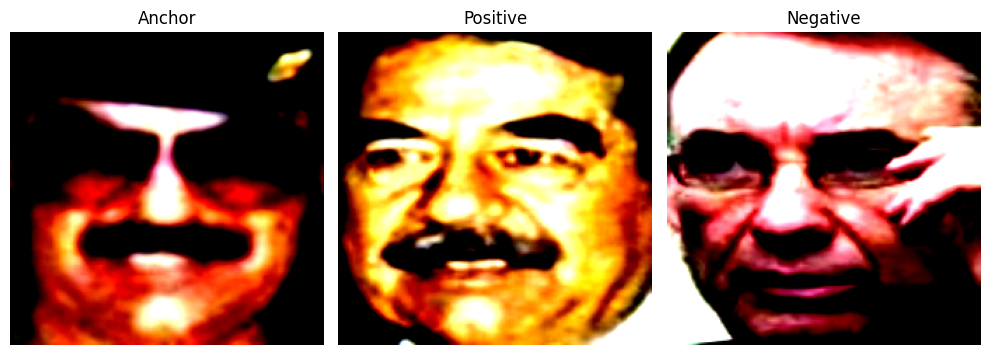

In [ ]:
# Generating one triplet
anchors, positives, negatives = next(iter(train_loader))

fig, axs = plt.subplots(1, 3, figsize=(10, 4))

# Transforming tensors into numpy arrays for visualization
anchors_np = anchors.permute(0, 2, 3, 1).numpy()
positives_np = positives.permute(0, 2, 3, 1).numpy()
negatives_np = negatives.permute(0, 2, 3, 1).numpy()

# Showing one triplet
axs[0].imshow(anchors_np[0])
axs[0].set_title('Anchor')
axs[1].imshow(positives_np[0])
axs[1].set_title('Positive')
axs[2].imshow(negatives_np[0])
axs[2].set_title('Negative')

# Removing axes
for ax in axs:
    ax.axis('off')

plt.tight_layout()
plt.show()

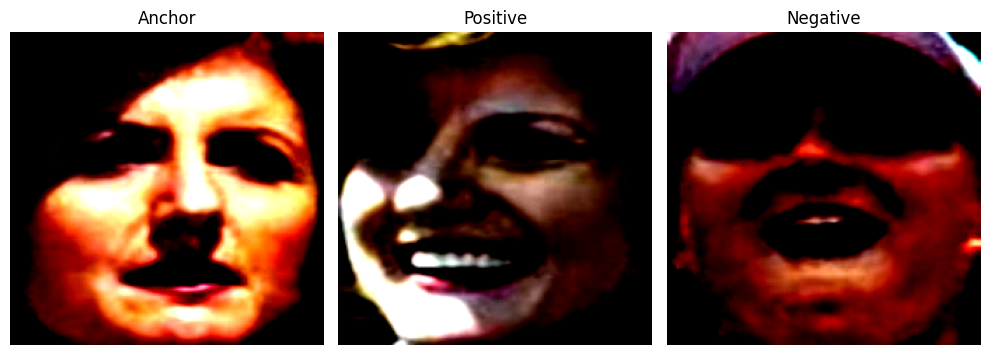

In [ ]:
# Generating one triplet
anchors, positives, negatives = next(iter(val_loader))

fig, axs = plt.subplots(1, 3, figsize=(10, 4))

# Transforming tensors into numpy arrays for visualization
anchors_np = anchors.permute(0, 2, 3, 1).numpy()
positives_np = positives.permute(0, 2, 3, 1).numpy()
negatives_np = negatives.permute(0, 2, 3, 1).numpy()

# Showing one triplet
axs[0].imshow(anchors_np[0])
axs[0].set_title('Anchor')
axs[1].imshow(positives_np[0])
axs[1].set_title('Positive')
axs[2].imshow(negatives_np[0])
axs[2].set_title('Negative')

# Removing axes
for ax in axs:
    ax.axis('off')

plt.tight_layout()
plt.show()

## Using TripletLoss for optimization

In [ ]:
class TripletLoss(nn.Module):
    def __init__(self, margin=1.0):
        super(TripletLoss, self).__init__()
        self.margin = margin

    def calc_euclidean(self, x1, x2):
        return (x1 - x2).pow(2).sum(1)

    def forward(self, anchor: torch.Tensor, positive: torch.Tensor, negative: torch.Tensor) -> torch.Tensor:
        distance_positive = self.calc_euclidean(anchor, positive)
        distance_negative = self.calc_euclidean(anchor, negative)
        losses = torch.relu(distance_positive - distance_negative + self.margin)

        return losses.mean()

In [ ]:
# Defining the training and validation procedures
def train_epoch(model, train_loader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for batch_idx, (anchors, positives, negatives) in tqdm(enumerate(train_loader)):
        anchors, positives, negatives = anchors.to(device), positives.to(device), negatives.to(device)
        optimizer.zero_grad()
        anchor_embeddings = model(anchors).squeeze(2,3)
        positive_embeddings = model(positives).squeeze(2,3)
        negative_embeddings = model(negatives).squeeze(2,3)
        loss = criterion(anchor_embeddings, positive_embeddings, negative_embeddings)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        #print(loss.item())
        #torch.cuda.empty_cache()
    avg_loss = running_loss / len(train_loader)
    print(f'Train Epoch: \tLoss: {avg_loss:.6f}')
    return avg_loss

def validate_epoch(model, val_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for batch_idx, (anchors, positives, negatives) in tqdm(enumerate(val_loader)):
            anchors, positives, negatives = anchors.to(device), positives.to(device), negatives.to(device)
            anchor_embeddings = model(anchors).squeeze(2,3)
            positive_embeddings = model(positives).squeeze(2,3)
            negative_embeddings = model(negatives).squeeze(2,3)
            loss = criterion(anchor_embeddings, positive_embeddings, negative_embeddings)
            running_loss += loss.item()
            #torch.cuda.empty_cache()
            #print(loss.item())
    avg_loss = running_loss / len(val_loader)
    print(f'Val Epoch: \tLoss: {avg_loss:.6f}')
    return avg_loss

## Importing a pre-trained model to fine-tune for our task

In [ ]:
import torch
from torchvision.models import resnet50

# Replace a model to CUDA if it is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Loading pre-trained ResNet-18/50
model = resnet50(weights='DEFAULT')
model = model.to(device).train()

# Removing AvgPool layer to get only features before fully connected layer
model = torch.nn.Sequential(*list(model.children())[:-1])

# Example of an inferenced batch and its dimensions
model(anchors.to(device)).squeeze(2,3).shape

OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 14.75 GiB of which 1.06 MiB is free. Process 6348 has 14.74 GiB memory in use. Of the allocated memory 14.39 GiB is allocated by PyTorch, and 246.98 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
criterion = TripletLoss()

optimizer = optim.Adam(model.parameters(), lr=0.005)

In [ ]:
# if torch.cuda.is_available():
#     # Get GPU 0 memory usage
#     gpu_memory_allocated = torch.cuda.memory_allocated(0) / (1024 ** 2)  # in MB
#     gpu_memory_reserved = torch.cuda.memory_reserved(0) / (1024 ** 2)  # in MB

In [ ]:
#torch.cuda.synchronize()

In [ ]:
#torch.cuda.empty_cache()

In [ ]:
# !kill -9 514090

/bin/bash: line 1: kill: (514090) - No such process


In [ ]:
criterion(model(anchors.to(device).squeeze(2,3)), model(positives.to(device).squeeze(2,3)), model(negatives.to(device).squeeze(2,3)))

tensor(10.0201, device='cuda:0', grad_fn=<MeanBackward0>)

In [ ]:
# Assessing loss on validation set before training
print("Val Epoch before training:")
validate_epoch(model, val_loader, criterion, device)

# Training a model for 10 epochs
num_epochs = 10
train_losses, val_losses = [], []

for epoch in range(num_epochs):
    print("----------------")
    print(f"Epoch {epoch+1}/{num_epochs} training:")
    train_loss = train_epoch(model, train_loader, optimizer, criterion, device)
    val_loss = validate_epoch(model, val_loader, criterion, device)
    train_losses.append(train_loss)
    val_losses.append(val_loss)

# Loss dynamics
plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

Val Epoch before training:


0it [00:00, ?it/s]

Val Epoch: 	Loss: 4.177605
----------------
Epoch 1/10 training:


0it [00:00, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 50.00 MiB. GPU 0 has a total capacity of 14.75 GiB of which 17.06 MiB is free. Process 6348 has 14.73 GiB memory in use. Of the allocated memory 14.30 GiB is allocated by PyTorch, and 313.73 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

## Saving results and the model instance

In [ ]:
# Saving losses as a JSON file
import json
losses = {
    "train_losses": train_losses,
    "val_losses": val_losses
}


with open("resnet50_losses.json", "w") as json_file:
    json.dump(losses, json_file, indent=4)

In [ ]:
criterion(model(anchors.to(device)), model(positives.to(device)), model(negatives.to(device)))

tensor(0.2463, device='cuda:0', grad_fn=<MeanBackward0>)

In [ ]:
model.eval()
# Saving model weights in a .pth format
torch.save(model.state_dict(), 'resnet50_weights.pth')


# Scripted version of the model
scripted_model = torch.jit.script(model)

# Saving model in a scripted format - .pt
scripted_model.save('resnet50_scripted.pt')

# Testing

In [1]:
import os
import random
import numpy as np
import torch
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.models import resnet18
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
from tqdm.notebook import tqdm

In [4]:
# Replace to CUDA if it is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = resnet18(weights=None)
model = model.to(device).eval()

# Removing last layer
model = torch.nn.Sequential(*list(model.children())[:-1])

# Loading weights from our trained model
model.load_state_dict(torch.load('/content/resnet18_weights.pth'))

<ipython-input-4-86e76cce90f9>:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/resnet18_weights.pth'))


FileNotFoundError: [Errno 2] No such file or directory: '/content/resnet18_weights.pth'

In [ ]:
def plot_images(image_path1, image_path2):
    fig, axes = plt.subplots(1, 2, figsize=(6, 4))

    axes[0].imshow(plt.imread(image_path1))
    axes[0].set_title('Image 1')
    axes[0].axis('off')

    axes[1].imshow(plt.imread(image_path2))
    axes[1].set_title('Image 2')
    axes[1].axis('off')


def load_and_preprocess_image(image_path):
    # Loading and transforming
    image = Image.open(image_path).convert('RGB')
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = preprocess(image)
    return image.unsqueeze(0)

def compute_distance(image1_path, image2_path, model, distance_metric='euclidean'):
    # Loading and preprocessing
    image1 = load_and_preprocess_image(image1_path)
    image2 = load_and_preprocess_image(image2_path)

    # Converting images to CUDA
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    image1 = image1.to(device)
    image2 = image2.to(device)

    # Inference
    with torch.no_grad():
        output1 = model(image1)
        output2 = model(image2)

    # Distances between images
    if distance_metric == 'euclidean':
        distance = torch.norm(output1 - output2)
    elif distance_metric == 'cosine':
        distance = torch.nn.functional.cosine_similarity(output1, output2)
    else:
        raise ValueError("False distance metrics. Available metrics are: 'euclidean' или 'cosine'.")

    return distance.item() # Getting distance measure as a number

## Performance on same person images VS different people images

Евклидово расстояние между изображениями: 1.3218671083450317
Косинусное расстояние между изображениями: 0.9973710775375366


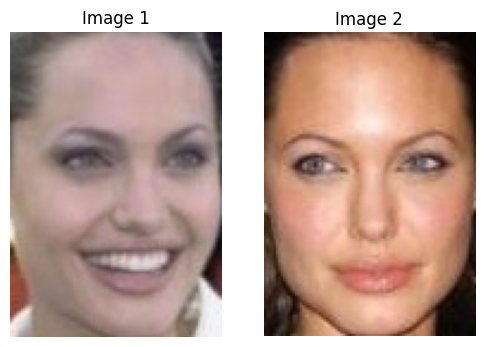

In [ ]:
# Example on same person images from LFW dataset
image1_path = '/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Angelina_Jolie/Angelina_Jolie_0001.jpg'
image2_path = '/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Angelina_Jolie/Angelina_Jolie_0006.jpg'
plot_images(image1_path, image2_path)
distance = compute_distance(image1_path, image2_path, model, distance_metric='euclidean')
print(f"Евклидово расстояние между изображениями: {distance}")

distance = compute_distance(image1_path, image2_path, model, distance_metric='cosine')
print(f"Косинусное расстояние между изображениями: {distance}")

Евклидово расстояние между изображениями: 2.3788819313049316
Косинусное расстояние между изображениями: 0.991396427154541


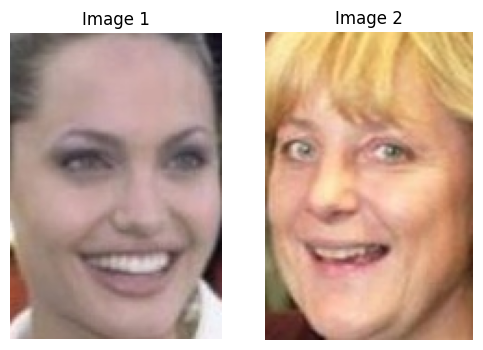

In [ ]:
# Example on different person images from LFW dataset
image1_path = '/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Angelina_Jolie/Angelina_Jolie_0001.jpg'
image2_path = '/content/drive/MyDrive/archive/lfw-deepfunneled/lfw-deepfunneled_cropped/Angela_Merkel/Angela_Merkel_0001.jpg'
plot_images(image1_path, image2_path)
distance = compute_distance(image1_path, image2_path, model, distance_metric='euclidean')
print(f"Евклидово расстояние между изображениями: {distance}")

distance = compute_distance(image1_path, image2_path, model, distance_metric='cosine')
print(f"Косинусное расстояние между изображениями: {distance}")

In [ ]:
import numpy as np
from PIL import Image
import torch
import torchvision.transforms as transforms
from deepface import DeepFace

def load_and_preprocess_image(image_path):
    # Loading images and transforming
    image = Image.open(image_path).convert('RGB')
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = preprocess(image)
    return image.unsqueeze(0)

def extract_faces_and_compute_distance(model, image_path1, image_path2, distance_metric='euclidean'):
    # Extracting faces
    face_image1 = DeepFace.extract_faces(image_path1,
                                         #target_size=(224, 224),
                                         detector_backend='opencv')
    face_image2 = DeepFace.extract_faces(image_path2,
                                         #target_size=(224, 224),
                                         detector_backend='opencv')

    # Convert images to PIL Image format and reshape to (224, 224)
    face_pil_image1 = Image.fromarray((face_image1[0]['face'] * 255).astype(np.uint8))
    face_pil_image2 = Image.fromarray((face_image2[0]['face'] * 255).astype(np.uint8))

    # Converting to tensors
    preprocess = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    face_tensor1 = preprocess(face_pil_image1).unsqueeze(0)
    face_tensor2 = preprocess(face_pil_image2).unsqueeze(0)

    # Converting to CUDA
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    face_tensor1 = face_tensor1.to(device)
    face_tensor2 = face_tensor2.to(device)

    # Inference
    with torch.no_grad():
        output1 = model(face_tensor1)
        output2 = model(face_tensor2)

    # Computing distance metrics
    if distance_metric == 'euclidean':
        distance = torch.norm(output1 - output2)
    elif distance_metric == 'cosine':
        distance = torch.nn.functional.cosine_similarity(output1, output2)
    else:
        raise ValueError("False distance metrics. Available metrics are: 'euclidean' или 'cosine'.")

    return distance.item()  # Getting distance measure as a number


## Performance on our images

Евклидово расстояние между изображениями лиц: 3.466935873031616
Косинусное расстояние между изображениями: 0.991396427154541


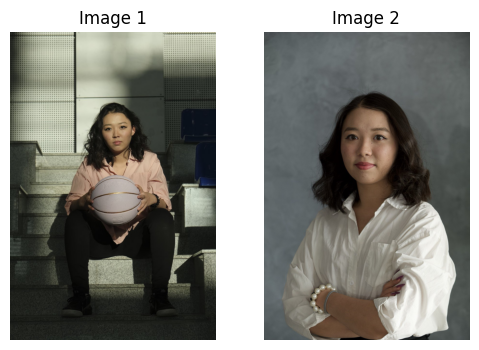

In [ ]:
# Example on same people images from our group
image_path1 = '/content/drive/MyDrive/archive/lfw-deepfunneled/Test Faces/Ayazhan/Ayazhan1.jpg'
image_path2 = '/content/drive/MyDrive/archive/lfw-deepfunneled/Test Faces/Ayazhan/Ayazhan2.jpg'
plot_images(image_path1, image_path2)
distance = extract_faces_and_compute_distance(model, image_path1, image_path2, distance_metric='euclidean')
print(f"Евклидово расстояние между изображениями лиц: {distance}")
distance = compute_distance(image1_path, image2_path, model, distance_metric='cosine')
print(f"Косинусное расстояние между изображениями: {distance}")

Евклидово расстояние между изображениями лиц: 6.447941780090332
Косинусное расстояние между изображениями: 0.991396427154541


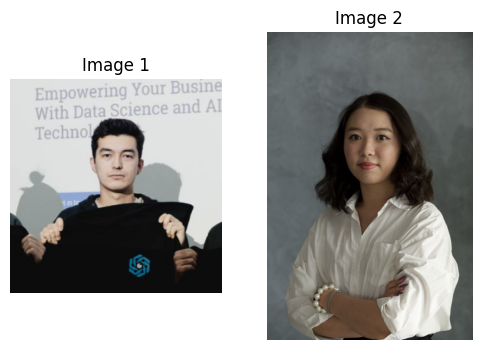

In [ ]:
# Example on different people from our group
image_path1 = '/content/drive/MyDrive/archive/lfw-deepfunneled/Test Faces/Temirlan/Tema1.png'
image_path2 = '/content/drive/MyDrive/archive/lfw-deepfunneled/Test Faces/Ayazhan/Ayazhan2.jpg'
plot_images(image_path1, image_path2)
distance = extract_faces_and_compute_distance(model, image_path1, image_path2, distance_metric='euclidean')
print(f"Евклидово расстояние между изображениями лиц: {distance}")
distance = compute_distance(image1_path, image2_path, model, distance_metric='cosine')
print(f"Косинусное расстояние между изображениями: {distance}")

Евклидово расстояние между изображениями лиц: 5.945626258850098
Косинусное расстояние между изображениями: 0.991396427154541


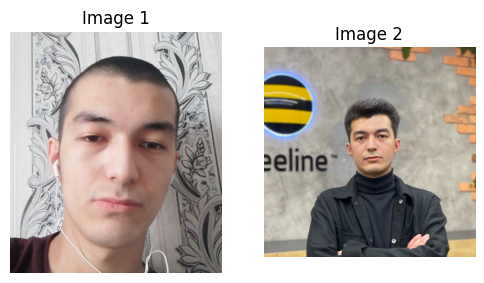

In [ ]:
# Example on same people images from our group
image_path1 = '/content/drive/MyDrive/archive/lfw-deepfunneled/Test Faces/Temirlan/Tema3.png'
image_path2 = '/content/drive/MyDrive/archive/lfw-deepfunneled/Test Faces/Temirlan/Tema2.png'
plot_images(image_path1, image_path2)
distance = extract_faces_and_compute_distance(model, image_path1, image_path2, distance_metric='euclidean')
print(f"Евклидово расстояние между изображениями лиц: {distance}")
distance = compute_distance(image1_path, image2_path, model, distance_metric='cosine')
print(f"Косинусное расстояние между изображениями: {distance}")

# It can be noticed that the distance for different people are larger than distance for same people - what our model is supposed to do eventually. One drawback of our models is that it does not differentiate images well in terms of cosine similarity; this may be due to the fact that we trained them for only 10 epochs with limited resources